In [98]:
!apt-get -qq -y install libnvtoolsext1 > /dev/null
!ln -snf /usr/lib/x86_64-linux-gnu/libnvrtc-builtins.so.8.0 /usr/lib/x86_64-linux-gnu/libnvrtc-builtins.so
!apt-get -qq -y install xvfb freeglut3-dev ffmpeg> /dev/null
!pip -q install gym
!pip -q install pyglet
!pip -q install pyopengl
!pip -q install pyvirtualdisplay

import gym
import numpy as np
import math
import matplotlib.pyplot as plt
from collections import deque
import random
from gym import wrappers
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1024, 768))
display.start()
import os
os.environ["DISPLAY"] = ":" + str(display.display) + "." + str(display.screen)
import matplotlib.animation
import numpy as np
from IPython.display import HTML
import torch
import torchvision
import torch.utils.tensorboard as tb
from PIL import Image
from torch.utils import data 
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.autograd import Variable
from datetime import datetime
import glob, os

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


xdpyinfo was not found, X start can not be checked! Please install xdpyinfo!


Episode finished after 200 timesteps
Episode finished after 200 timesteps
Episode finished after 200 timesteps
Episode finished after 200 timesteps
Episode finished after 200 timesteps
Episode finished after 200 timesteps
Episode finished after 200 timesteps
Episode finished after 200 timesteps
Episode finished after 200 timesteps
Episode finished after 200 timesteps
mean_reward: -200.0


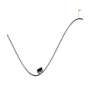

In [99]:
class ResizeObservation(gym.Wrapper):
    def __init__(self, env, shape):
        super(ResizeObservation, self).__init__(env)
        if isinstance(shape, int):
            shape = (shape, shape)
        assert all(x > 0 for x in shape), shape
        self.env = env
        self.shape = tuple(shape)

    def render(self):
        from PIL import Image
        obs = self.env.render(mode = 'rgb_array')
        im = Image.fromarray(np.uint8(obs))
        im = im.resize(self.shape)
        return np.asarray(im)



def dummy_policy(env, num_episodes):
  rewards_all = 0
  frames = []
  for episode in range(num_episodes):
    observation = env.reset()
    for t in range(200):
      action = env.action_space.sample()
      observation, reward, done, info = env.step(action)
      rewards_all += reward
      a = env.render()
      if done:
        print("Episode finished after {} timesteps".format(t+1))
        break
      if episode == num_episodes-1:
        frames.append(a)
  env.close()
  mean_reward = rewards_all / num_episodes
  print("mean_reward:", mean_reward)
  return mean_reward, frames

resize_observation_shape = 100
env = gym.make('MountainCar-v0')
env = ResizeObservation(env, resize_observation_shape)

rew, frames = dummy_policy(env, 10)

# Video plotting
plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())

In [0]:
def discretize(state, discretization, env):
    env_minimum = env.observation_space.low
    state_adj = (state - env_minimum)*discretization
    discretized_state = np.round(state_adj, 0).astype(int)

    return discretized_state


def choose_action(epsilon, Q, state, env):
    action = 0
    if np.random.random() < 1 - epsilon:
        action = np.argmax(Q[state[0], state[1]]) 
    else:
        action = np.random.randint(0, env.action_space.n)
  
    return action


def update_epsilon(epsilon, decay_rate):
    epsilon *= decay_rate

    return epsilon


def update_Q(Q, state_disc, next_state_disc, action, discount, learning_rate, reward, terminal):   
    if terminal:        
        Q[state_disc[0], state_disc[1], action] = reward

    # Adjust Q value
    else:
        delta = learning_rate*(reward + discount*np.max(Q[next_state_disc[0], next_state_disc[1]]) - Q[state_disc[0], state_disc[1],action])
        Q[state_disc[0], state_disc[1],action] += delta
  
    return Q

In [0]:
class ResizeObservation(gym.Wrapper):
    def __init__(self, env, shape):
        super(ResizeObservation, self).__init__(env)
        if isinstance(shape, int):
            shape = (shape, shape)
        assert all(x > 0 for x in shape), shape
        self.env = env
        self.shape = tuple(shape)

    def render(self):

        from PIL import Image
        obs = self.env.render(mode = 'rgb_array')
        im = Image.fromarray(np.uint8(obs))
        im = im.resize(self.shape)
        return np.asarray(im)

In [0]:
def Qlearning(Q, discretization, env, learning_rate, discount, epsilon, decay_rate, max_episodes=15000):
    reward_list = []
    position_list = []
    success_list = []
    success = 0
    frames = []
  
    for i in range(max_episodes):
        # parameters
        done = False
        terminal = False
        tot_reward = 0
        state = env.reset()
        state_disc = discretize(state,discretization,env)

        while done != True:                 
            action = choose_action(epsilon, Q, state_disc, env)                                      
            if i==1 or i==(max_episodes-1):
              frames.append(env.render())
            next_state, reward, done, _ = env.step(action) 
            next_state_disc = discretize(next_state,discretization,env)
            # Update terminal
            terminal = done and next_state[0]>=0.5
            # Update Q
            Q = update_Q(Q,state_disc,next_state_disc,action,discount,learning_rate, reward, terminal)  
            tot_reward += reward
            state_disc = next_state_disc

            if terminal: success +=1 
            
        epsilon = update_epsilon(epsilon, decay_rate)

        # Track rewards
        reward_list.append(tot_reward)
        position_list.append(next_state[0])
        success_list.append(success/(i+1))

        if (i+1) % 100 == 0:
            print('Episode: ', i+1, 'Average Reward over 100 Episodes: ',np.mean(reward_list))
            reward_list = []
                
    env.close()
    
    return Q, position_list, success_list, frames

## Q-learning

In [103]:
# Initialize Mountain Car Environment
env = gym.make('MountainCar-v0')
env = ResizeObservation(env,100)
env.seed(42)
np.random.seed(42)
env.reset()
  
learning_rate = 0.2 
discount = 0.9
epsilon = 0.8 
decay_rate = 0.95
max_episodes = 15000
discretization = np.array([10,100])


num_states = (env.observation_space.high - env.observation_space.low)*discretization
num_states = np.round(num_states, 0).astype(int) + 1
# Initialize Q table
Q = np.random.uniform(low = -1, 
                      high = 1, 
                      size = (num_states[0], num_states[1], env.action_space.n))

Q, position, successes, frames = Qlearning(Q, discretization, env, learning_rate, discount, epsilon, decay_rate, max_episodes)

np.save('./expert_Q.npy',Q)

Episode:  100 Average Reward over 100 Episodes:  -200.0
Episode:  200 Average Reward over 100 Episodes:  -200.0
Episode:  300 Average Reward over 100 Episodes:  -199.31
Episode:  400 Average Reward over 100 Episodes:  -199.5
Episode:  500 Average Reward over 100 Episodes:  -187.22
Episode:  600 Average Reward over 100 Episodes:  -197.59
Episode:  700 Average Reward over 100 Episodes:  -193.0
Episode:  800 Average Reward over 100 Episodes:  -198.56
Episode:  900 Average Reward over 100 Episodes:  -178.68
Episode:  1000 Average Reward over 100 Episodes:  -179.05
Episode:  1100 Average Reward over 100 Episodes:  -177.91
Episode:  1200 Average Reward over 100 Episodes:  -157.72
Episode:  1300 Average Reward over 100 Episodes:  -185.27
Episode:  1400 Average Reward over 100 Episodes:  -176.04
Episode:  1500 Average Reward over 100 Episodes:  -191.86
Episode:  1600 Average Reward over 100 Episodes:  -184.11
Episode:  1700 Average Reward over 100 Episodes:  -170.33
Episode:  1800 Average Rewa

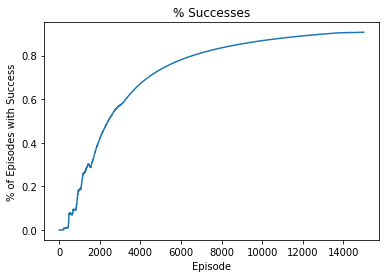

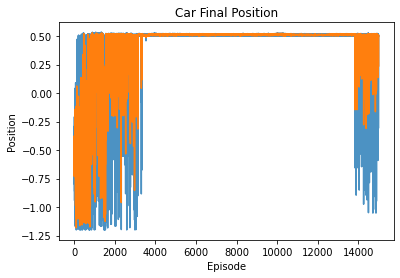

In [104]:
import pandas as pd 

plt.plot(successes)
plt.xlabel('Episode')
plt.ylabel('% of Episodes with Success')
plt.title('% Successes')
plt.show()
plt.close()
p = pd.Series(position)
ma = p.rolling(3).mean()
plt.plot(p, alpha=0.8)
plt.plot(ma)
plt.xlabel('Episode')
plt.ylabel('Position')
plt.title('Car Final Position')
plt.show()

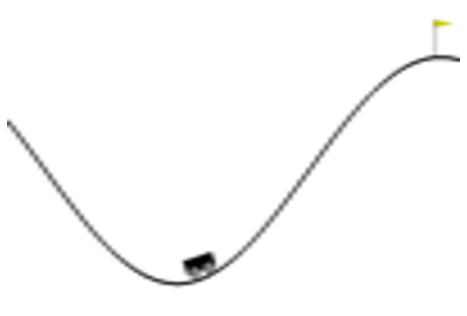

In [105]:
# Video plotting
deep_frames = []
for obs in frames:
  im = Image.fromarray(np.uint8(obs))
  im = im.resize((600,400))
  deep_frames.append(np.asarray(im))

plt.figure(figsize=(deep_frames[0].shape[1] / 72.0, deep_frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(deep_frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(deep_frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(deep_frames), interval = 50)
HTML(ani.to_jshtml())

In [0]:
def get_expert_action(Q,discretization,env,state):
  state_disc = discretize(state,discretization,env)
  state_disc = state_disc.reshape(2,)
  action = np.argmax(Q[state_disc[0], state_disc[1]]) 
  return action

In [0]:
def generate_expert_trajectories(Q, discretization, env, num_episodes=150, data_path='./data'):

  import os
  if not os.path.exists(data_path):
    os.makedirs(data_path)
  total_samples = 0
  for i in range(num_episodes):
    state = env.reset()
    episode_dict = {}  
    episode_observations = []
    episode_actions = []
    for j in range(200):
      total_samples += 1
      episode_obs = state
      episode_acts = get_expert_action(Q,discretization,env,state)
      episode_observations.append(episode_obs)
      episode_actions.append(episode_acts)
      next_state, reward, done, _ = env.step(episode_acts)
      state = next_state
      if done:
        break
      episode_dict['observations'] = episode_observations
      episode_dict['actions'] = episode_actions
    np.savez_compressed(data_path+'/episode_number'+'_'+str(i)+'.npz',**episode_dict)
  return total_samples


In [108]:
num_episodes = 100
data_path = './data'
total_samples = generate_expert_trajectories(Q,discretization,env,num_episodes,data_path) 

print('---------Total Samples Recorded were --------', total_samples)

---------Total Samples Recorded were -------- 15101


## Deep Imitation Learning


In [0]:
def load_initial_data(args):
  import os
  observations_all = []
  actions_all = []
  file_name_list = []

  for ele in os.listdir(args.datapath):
    if ele[-3:] == 'npz':
      file_name_list.append(ele)

  for i in range(args.initial_episodes_to_use):
    NameData = args.datapath + '/'+  file_name_list[i]
    EpisodeDict = np.load(NameData)
    observation = EpisodeDict["observations"]
    observation = discretize(observation,args.discretization,args.env)
    observations_all.extend(observation)
    action = EpisodeDict['actions']
    actions_all.extend(action)

  observations_all_arr = np.array(observations_all)
  actions_all_arr = np.array(actions_all)
  training_observations = observations_all_arr.reshape(-1,2)
  training_actions = actions_all_arr
  print (len(training_observations))
  print (len(training_actions))
  return training_observations, training_actions


In [0]:
class SuperTuxDataset(Dataset):
    def __init__(self, observations,actions):
        self.observations = observations
        self.actions = actions

    def __len__(self):
        return self.actions.shape[0]

    def __getitem__(self, idx):
        item = (self.observations[idx],self.actions[idx])
        return item

def load_dataset(args, observations, actions, batch_size=30, data_transforms=None, num_workers=0):
  dataset = SuperTuxDataset(observations, actions)
  dataloader = torch.utils.data.DataLoader(dataset,num_workers = num_workers,batch_size = batch_size,shuffle = True)

  return dataloader

In [0]:
def preprocess_individual_observation(args,observation):
  observations = observation.reshape((1,2))
  observations = discretize(observations,args.discretization,args.env)

  data = torch.from_numpy(observations)
  data = data.double()

  return data

In [0]:
class StatesNetwork(nn.Module):
  def __init__(self, env):
      super(StatesNetwork, self).__init__() 
      self.layer1 = nn.Sequential(     
          nn.Linear(2, 8),                      
          nn.BatchNorm1d(8),
          nn.ReLU(),                      
      )
      self.layer2 = nn.Sequential(         
          nn.Linear(8, 16),    
          nn.BatchNorm1d(16),
          nn.ReLU(),                       
      )
      self.layer3 = nn.Sequential(         
          nn.Linear(16, 32),    
          nn.BatchNorm1d(32),
          nn.ReLU(),                      
      )
      self.layer4 = nn.Sequential(         
          nn.Linear(32, 32), 
          nn.BatchNorm1d(32),
          nn.ReLU(),                      
      )
      self.drop_out = nn.Dropout()        
      self.FC= nn.Linear(32, 3) # fully connected layer
  
  def forward(self, x): 
      x = self.layer1(x)
      x = self.drop_out(x)
      x = self.layer2(x)
      x = self.drop_out(x)
      x = self.layer3(x)
      x = self.drop_out(x)
      x = self.layer4(x)
      output = self.FC(x)
      return output  


In [0]:
def train_model(args):
  import torch.optim
  from torch.utils.tensorboard import SummaryWriter
  iteration = 0

  writer = SummaryWriter()
  trainloader = args.trainloader
  NeuralNetwork = args.model
  iterations = []
  loss_func = nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(NeuralNetwork.parameters(), lr=0.001, weight_decay = 0.01)
  train_loss_each_time = []

  mean_reward_each_epoch = []
  mean_success_each_epoch = []

  for epoch in range(args.num_epochs):
    train_loss_all = 0
    
    for i, data in enumerate(trainloader, 0):
      train_data, label = data
      train_data = train_data.double()
      label = label.long()
      optimizer.zero_grad()
      pred = NeuralNetwork(train_data)
      loss = loss_func(pred, label)
      loss.backward()
      optimizer.step()

      train_loss_each_time.append(loss.item()) 
      train_loss_all += loss.item()


      iteration += 1
      iterations.append(iteration)
      (args.a).append(loss.item())
      if i%100 == 0:
        print('[%d, %5d] loss: %.3f' %
          (epoch + 1, i + 1, train_loss_all / 100)) 
        train_loss_all = 0.0

    total_reward_each_epoch = 0
    total_success_each_epoch = 0

    for i in range(5):
     final_position,success, frames, episode_reward = test_model(args, record_frames=False)
     total_reward_each_epoch += episode_reward
     total_success_each_epoch += success
    mean_reward_each_epoch.append(total_reward_each_epoch/5)
    mean_success_each_epoch.append(total_success_each_epoch/5)

  return NeuralNetwork

In [0]:
def execute_dagger(args):
  env = args.env
  observation = env.reset()
  model = args.model
  done = False

  imitation_observations = []
  expert_actions = []
  while not done:
    observation = observation.reshape((1,2))
    observation_dis = discretize(observation,args.discretization,args.env)

    imitation_observations.append(observation_dis) #get observations from network
    obs_ter = torch.from_numpy(observation_dis).double()
    logit = model(obs_ter)
    action_nn = torch.argmax(logit).item()
    action_expert = get_expert_action(args.Q,args.discretization,env,observation)  
    expert_actions.append(action_expert)  # get actions from expert
    observation, r, done, _ = env.step(action_nn)
                                 
  return np.array(imitation_observations).reshape(-1,2), np.array(expert_actions)

In [0]:
def aggregate_dataset(training_observations, training_actions, imitation_states, expert_actions):
  training_observations = np.append(training_observations,imitation_states, axis = 0)
  training_actions = np.append(training_actions,expert_actions) 
  return training_observations, training_actions 

In [0]:
import numpy as np
from torchvision.transforms import functional as TF

def accuracy(outputs, labels):
    outputs_idx = outputs.max(1)[1].type_as(labels)
    return outputs_idx.eq(labels).float().mean()

def predict(model, inputs, device='cpu'):
    inputs = inputs.to(device)
    logits = model(inputs)
    return F.softmax(logits, -1)

In [0]:
class ResizeObservation(gym.Wrapper):
    def __init__(self, env, shape):
        super(ResizeObservation, self).__init__(env)
        if isinstance(shape, int):
            shape = (shape, shape)
        assert all(x > 0 for x in shape), shape
        self.env = env
        self.shape = tuple(shape)

    def render(self):

        from PIL import Image
        obs = self.env.render(mode = 'rgb_array')
        im = Image.fromarray(np.uint8(obs))
        im = im.resize(self.shape)
        return np.asarray(im)

In [0]:
def test_model(args, record_frames=False):
    frames = []
    env = args.env 
    model = args.model
    state = env.reset()

    model.eval()

    episode_reward = 0

    success = False
    done = False 

    while not done:

        observation = state

        data = preprocess_individual_observation(args,observation)
        logit = model(data)
        action = torch.argmax(logit).item()

        if record_frames: #You can change the rate of recording frames as you like
            frames.append(env.render())

        next_state, reward, done, _ = env.step(action) 
        episode_reward += reward

        if done:    
            if next_state[0] >= 0.5:
                success = True
            final_position = next_state[0]
            return final_position,success, frames, episode_reward
        else:
            state = next_state

In [0]:
def imitate(args):
  from torch import save
  from torch import load
  from os import path
  if not args.do_dagger:
    observations, actions = load_initial_data(args)
    args.trainloader = load_dataset(args,observations,actions) 
    args.model = train_model(args) 
    
    save((args.model).state_dict(), path.join(path.dirname(path.abspath("__file__")), 'pi_1.th')) 

  else:
    mean_reward_each_eposide = []
    mean_success_each_eposide = []

    args.initial_episodes_to_use = 2
    training_observations, training_actions = load_initial_data(args)
    args.trainloader = load_dataset(args,training_observations,training_actions) # the data for training
    final_positions = [args]
    args.model = train_model(args) # the model is after training with episodes = 2
    for i in range(args.max_dagger_iterations):
      a,b = execute_dagger(args)
      training_observations, training_actions = aggregate_dataset(training_observations, training_actions,a,b)
      args.trainloader = load_dataset(args,training_observations,training_actions) # the data for training
      args.model = train_model(args) # the model is after training


      total_reward_each_eposide = 0
      total_success_each_eposide = 0
      for j in range(5):
        final_position,success, frames, episode_reward = test_model(args, record_frames=False)
        total_reward_each_eposide += episode_reward
        total_success_each_eposide += success
      mean_reward_each_eposide.append(total_reward_each_eposide/5)
      mean_success_each_eposide.append(total_success_each_eposide/5)

  return args


In [120]:
def get_args():
  class Args(object):
    pass

  args = Args();
  args.datapath = './data'
  resize_observation_shape = 100
  args.env = ResizeObservation(gym.make('MountainCar-v0'), resize_observation_shape)
  args.do_dagger = True
  if args.do_dagger:
    args.max_dagger_iterations = 18
  if not args.do_dagger:
    args.max_dagger_iterations = 1
  args.record_frames = True
  args.initial_episodes_to_use = 20
  args.model = StatesNetwork(args.env).double()
  args.num_epochs = 2
  args.Q = np.load('./expert_Q.npy',allow_pickle=True)
  args.discretization = np.array([10,100])
  args.a = []
  return args

args = get_args()
args = imitate(args)
print(len(args.a))


298
298
[1,     1] loss: 0.011
[2,     1] loss: 0.011
[1,     1] loss: 0.010
[2,     1] loss: 0.010
[1,     1] loss: 0.009
[2,     1] loss: 0.006
[1,     1] loss: 0.006
[2,     1] loss: 0.007
[1,     1] loss: 0.004
[2,     1] loss: 0.005
[1,     1] loss: 0.008
[2,     1] loss: 0.006
[1,     1] loss: 0.006
[2,     1] loss: 0.006
[1,     1] loss: 0.007
[2,     1] loss: 0.007
[1,     1] loss: 0.005
[2,     1] loss: 0.004
[1,     1] loss: 0.007
[2,     1] loss: 0.010
[1,     1] loss: 0.006
[2,     1] loss: 0.008
[1,     1] loss: 0.008
[2,     1] loss: 0.007
[1,     1] loss: 0.008
[2,     1] loss: 0.006
[1,     1] loss: 0.007
[2,     1] loss: 0.008
[1,     1] loss: 0.007
[2,     1] loss: 0.007
[1,     1] loss: 0.007
[2,     1] loss: 0.007
[1,     1] loss: 0.008
[2,     1] loss: 0.004
[1,     1] loss: 0.006
[2,     1] loss: 0.006
[1,     1] loss: 0.006
[2,     1] loss: 0.005
2094


2094 2094 1.102811956066719


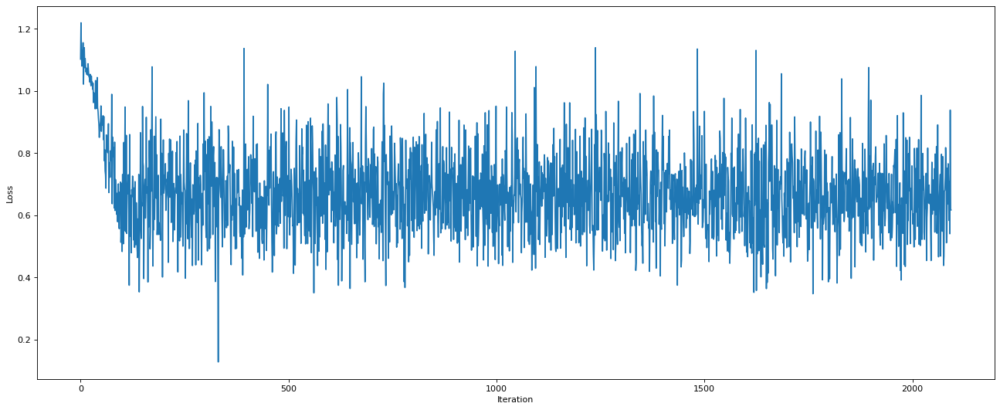

In [121]:
import matplotlib.pyplot as plt
b = []
for i in range(len(args.a)):
  b.append(i)
print(len(b), len(args.a), (args.a)[0])
plt.figure(figsize=(20,8),dpi=80) 
plt.plot(b, args.a)   
plt.xlabel('Iteration')
plt.ylabel("Loss")     
plt.show()

In [122]:
def get_average_performance(args, run_for=1000):

  final_positions = 0
  successes = 0
  rewards = 0

  for ep in range(run_for):
    pos, success, _, episode_rewards = test_model(args, record_frames=False)   #test imitation policy
    final_positions += pos 
    rewards += episode_rewards
    if success:
      successes += 1
    # print('Running Episode: ',ep,' Success: ', success)
    average_final_positions = final_positions/(ep+1)
    average_success_rate = 100*(successes/(ep+1))
    average_episode_rewards = rewards/(ep+1)

  return average_final_positions, average_success_rate, average_episode_rewards 

final_pos, succ_rate, ep_rwds = get_average_performance(args)

print('Average Final Position achieved by the Agent: ',final_pos)
print('Average Success Rate achieved by the Agent: ',succ_rate)
print('Average Episode Reward achieved by the Agent: ',ep_rwds)

Average Final Position achieved by the Agent:  0.5156096720423454
Average Success Rate achieved by the Agent:  100.0
Average Episode Reward achieved by the Agent:  -140.739


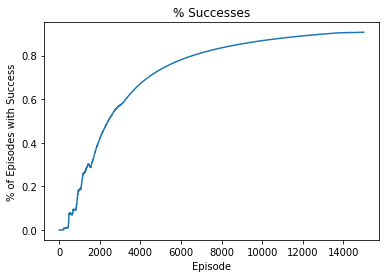

In [123]:
import pandas as pd 

plt.plot(successes)
plt.xlabel('Episode')
plt.ylabel('% of Episodes with Success')
plt.title('% Successes')
plt.show()
plt.close()
